In [1]:
!pip install pandas numpy matplotlib seaborn scikit-learn
!pip install xgboost
!pip install plotly
!pip install scipy


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# ✅ IMPORTS
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier, plot_importance
import plotly.express as px
from scipy.stats import randint, uniform

In [3]:
# ✅ LOAD DATA
df = pd.read_csv("heart.csv")

In [4]:
# ✅ Convert multi-class target into binary (0 = No Disease, 1 = Disease)
df["target"] = df["num"].apply(lambda x: 1 if x > 0 else 0)
df.drop("num", axis=1, inplace=True)

In [5]:
# ✅ One-hot encode categorical features
df_encoded = pd.get_dummies(df, drop_first=True)

In [6]:
# ✅ EDA
print("Data Shape:", df_encoded.shape)
print("Info:\n", df_encoded.info())
print("Summary:\n", df_encoded.describe())
print("Missing values:\n", df_encoded.isnull().sum())

Data Shape: (920, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        920 non-null    int64  
 1   age                       920 non-null    int64  
 2   trestbps                  861 non-null    float64
 3   chol                      890 non-null    float64
 4   thalch                    865 non-null    float64
 5   oldpeak                   858 non-null    float64
 6   ca                        309 non-null    float64
 7   target                    920 non-null    int64  
 8   sex_Male                  920 non-null    bool   
 9   dataset_Hungary           920 non-null    bool   
 10  dataset_Switzerland       920 non-null    bool   
 11  dataset_VA Long Beach     920 non-null    bool   
 12  cp_atypical angina        920 non-null    bool   
 13  cp_non-anginal            920 non-null    b

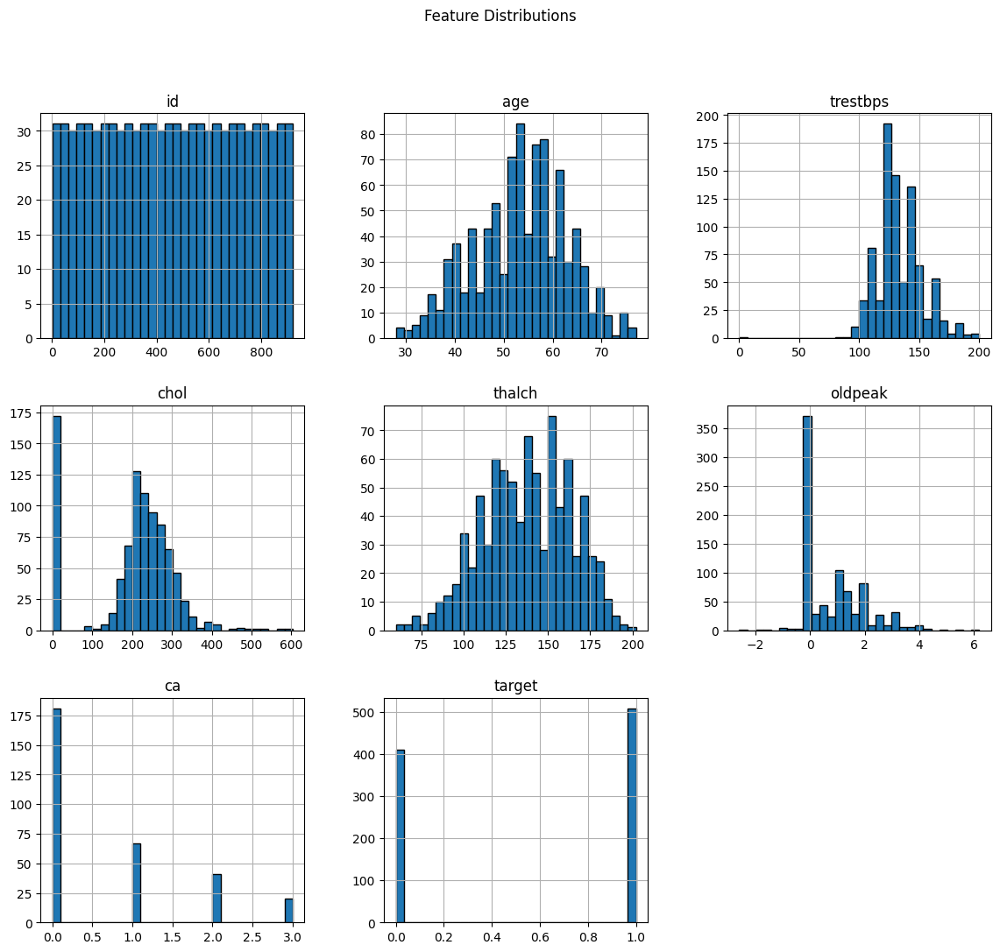

In [7]:
# ✅ HISTOGRAMS
df_encoded.hist(figsize=(14, 12), bins=30, edgecolor='black')
plt.suptitle("Feature Distributions")
plt.show()

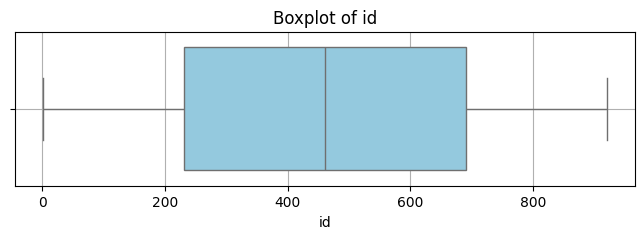

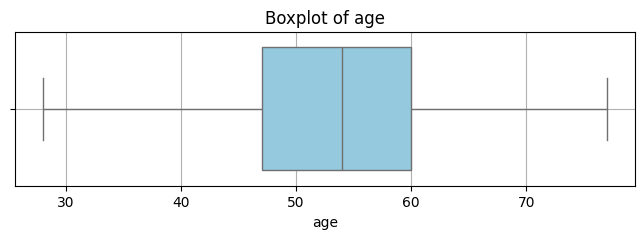

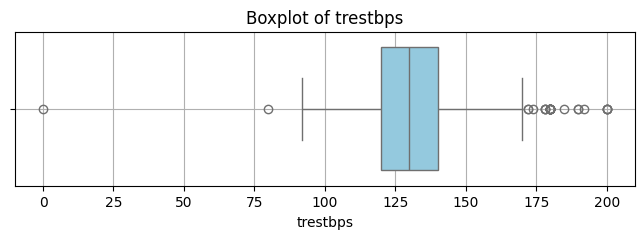

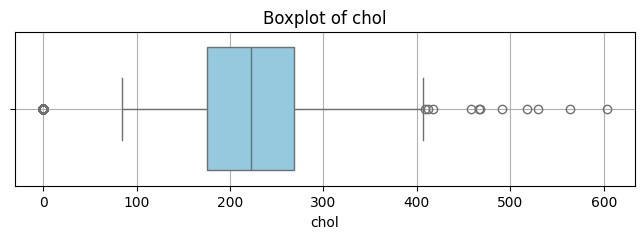

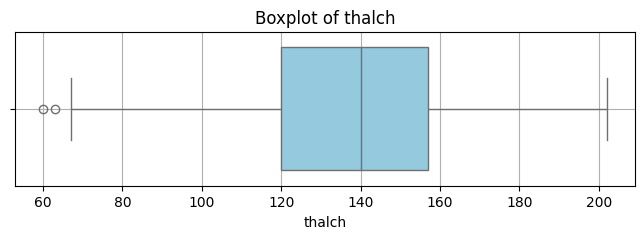

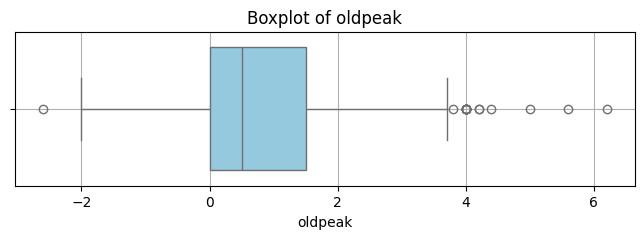

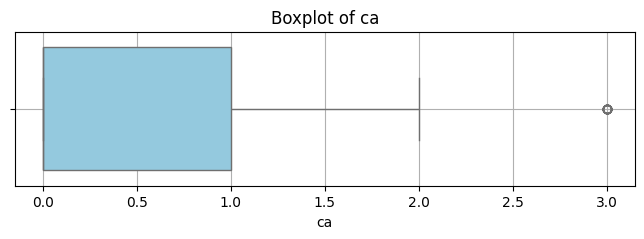

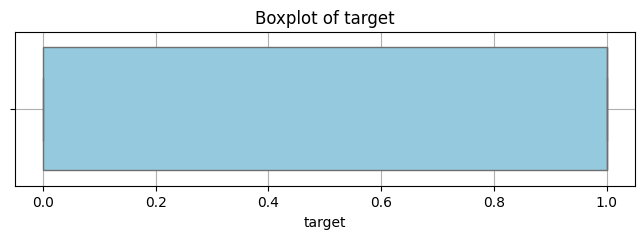

In [8]:
# ✅ BOXPLOTS
for col in df_encoded.select_dtypes(include=np.number).columns:
    plt.figure(figsize=(8, 2))
    sns.boxplot(x=df_encoded[col], color='skyblue')
    plt.title(f"Boxplot of {col}")
    plt.grid(True)
    plt.show()

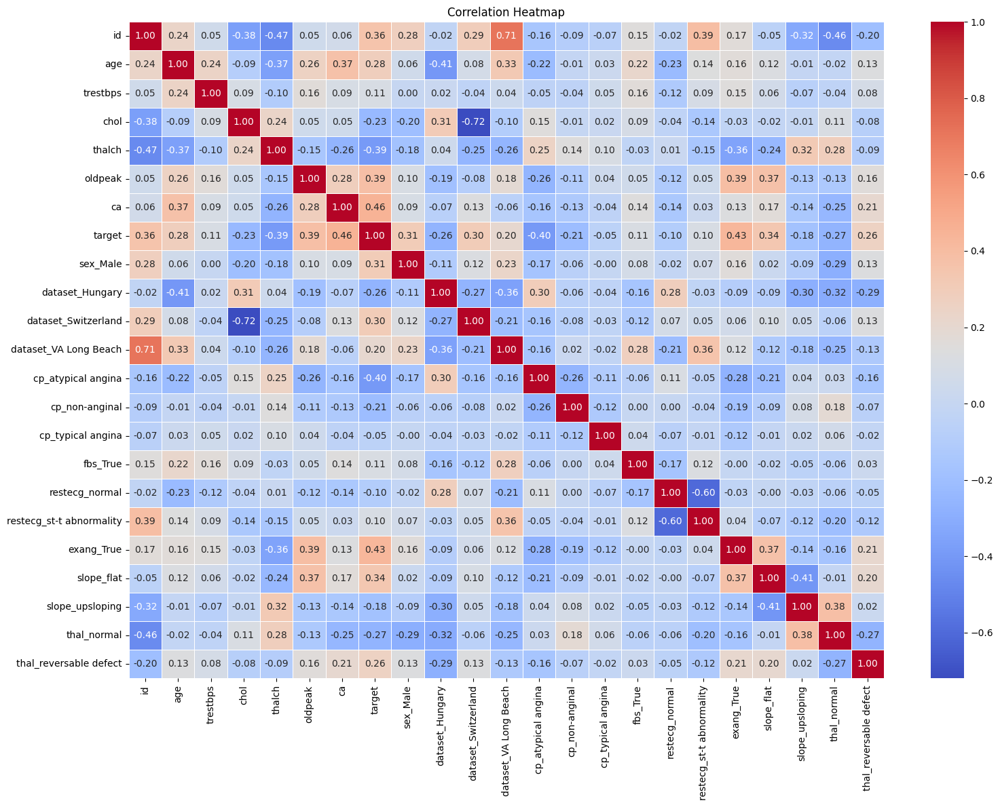

In [9]:
# ✅ HEATMAP
plt.figure(figsize=(16, 12))
sns.heatmap(df_encoded.corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

C:\Users\Jagruti\AppData\Local\Temp\ipykernel_5796\1984746202.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='target', data=df_encoded, palette='Set2')


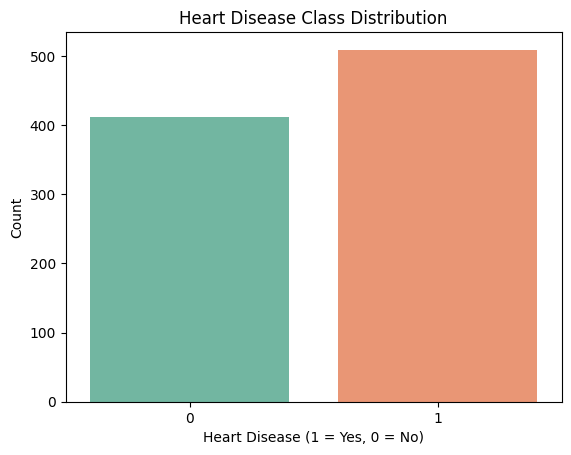

In [10]:
# ✅ TARGET DISTRIBUTION
sns.countplot(x='target', data=df_encoded, palette='Set2')
plt.title("Heart Disease Class Distribution")
plt.xlabel("Heart Disease (1 = Yes, 0 = No)")
plt.ylabel("Count")
plt.show()

In [11]:
# ✅ SPLIT
X = df_encoded.drop("target", axis=1)
y = df_encoded["target"]

In [12]:
# ✅ HANDLE MISSING VALUES
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

In [13]:
# ✅ SCALING
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

In [14]:
# ✅ TRAIN-TEST SPLIT
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [15]:
# ✅ XGBOOST BASELINE
xgb = XGBClassifier(eval_metric='logloss', random_state=42)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [16]:
# ✅ CROSS-VALIDATION
cv_scores = cross_val_score(xgb, X_train, y_train, cv=5)
print("Cross-Validation Scores:", np.round(cv_scores, 3))
print("Mean CV Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.885 0.857 0.83  0.857 0.857]
Mean CV Accuracy: 0.8572991358705645


In [17]:
# ✅ HYPERPARAMETER TUNING
param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.5, 0.4),
    'gamma': uniform(0, 0.5)
}
search = RandomizedSearchCV(
    XGBClassifier(eval_metric='logloss'),
    param_distributions=param_dist,
    n_iter=20,
    scoring='accuracy',
    cv=5,
    random_state=42,
    n_jobs=-1
)
search.fit(X_train, y_train)
print("Best Parameters:", search.best_params_)

Best Parameters: {'colsample_bytree': 0.7090931317527976, 'gamma': 0.21377050917927481, 'learning_rate': 0.017625738023228556, 'max_depth': 7, 'n_estimators': 228, 'subsample': 0.6125716742746937}


In [18]:
# ✅ FINAL MODEL
final_model = search.best_estimator_
y_pred = final_model.predict(X_test)

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Accuracy Score:", accuracy_score(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.88      0.86        75
           1       0.92      0.89      0.90       109

    accuracy                           0.89       184
   macro avg       0.88      0.88      0.88       184
weighted avg       0.89      0.89      0.89       184

Confusion Matrix:
 [[66  9]
 [12 97]]
Accuracy Score: 0.8858695652173914


<Figure size 1000x600 with 0 Axes>

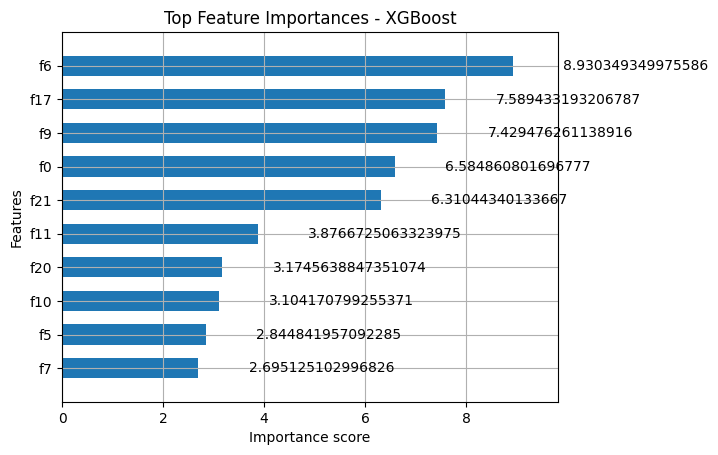

In [19]:
# ✅ FEATURE IMPORTANCE
plt.figure(figsize=(10, 6))
plot_importance(final_model, importance_type='gain', max_num_features=10, height=0.6)
plt.title("Top Feature Importances - XGBoost")
plt.show()

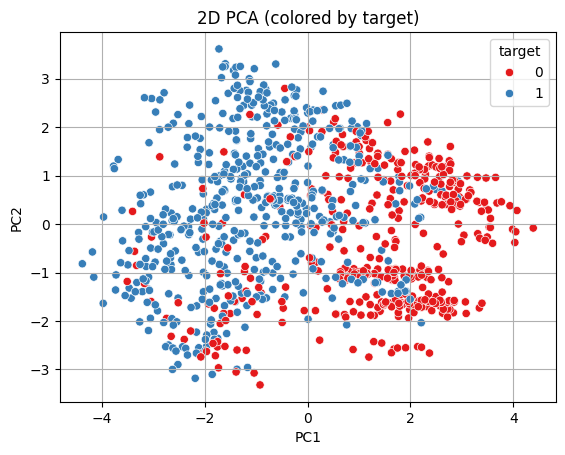

In [20]:
# ✅ PCA 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
pca_df["target"] = y.reset_index(drop=True)

sns.scatterplot(data=pca_df, x="PC1", y="PC2", hue="target", palette="Set1")
plt.title("2D PCA (colored by target)")
plt.grid(True)
plt.show()

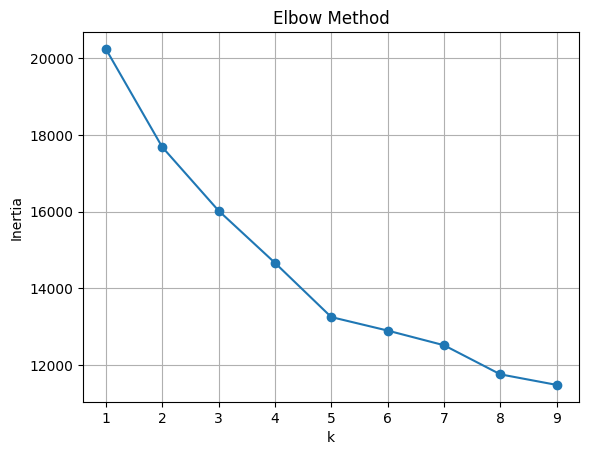

In [21]:
# ✅ ELBOW METHOD
inertia = []
for k in range(1, 10):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(X_scaled)
    inertia.append(km.inertia_)

plt.plot(range(1, 10), inertia, marker='o')
plt.title("Elbow Method")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.grid(True)
plt.show()

In [22]:
# ✅ KMEANS CLUSTERING
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X_scaled)
pca_df["cluster"] = clusters

In [23]:
# ✅ CLUSTER COMPARISON
print("\nTarget vs Cluster:\n", pd.crosstab(pca_df["target"], pca_df["cluster"]))
print("Silhouette Score:", silhouette_score(X_scaled, clusters))



Target vs Cluster:
 cluster    0    1
target           
0        341   70
1        102  407
Silhouette Score: 0.12742386371311962


In [24]:
# ✅ PCA 3D VISUALIZATION
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)
pca_3d_df = pd.DataFrame(X_pca_3d, columns=["PC1", "PC2", "PC3"])
pca_3d_df["target"] = y.reset_index(drop=True)
pca_3d_df["cluster"] = clusters

fig1 = px.scatter_3d(pca_3d_df, x="PC1", y="PC2", z="PC3",
                     color=pca_3d_df["target"].astype(str),
                     title="3D PCA (colored by target)")
fig1.show()

fig2 = px.scatter_3d(pca_3d_df, x="PC1", y="PC2", z="PC3",
                     color=pca_3d_df["cluster"].astype(str),
                     title="3D PCA (colored by cluster)")
fig2.show()